# Imports

In [2]:
import os
import pickle
import pandas as pd
import numpy as np
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm  # Use the notebook-friendly version

# !pip install plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = 'notebook'  # or 'inline' or 'iframe' depending on environment

import IPython
import torch
from speechbrain.dataio.dataio import read_audio, write_audio
from loquacious_set_prepare_filter import load_datasets


# LeBenchmark small

In [72]:
mfcc_sm_path = "/local_disk/apollon/rwhetten/sss_data_selection/save/lebench/lb_mel_sm_ckpt.pkl"
speaker_sm_path = "/local_disk/apollon/rwhetten/sss_data_selection/save/lebench/lb_speaker_sm_ckpt.pkl"
csv_location = "/users/rwhetten/LeBenchmark/sm/train.csv"
save_folder = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm"
fractions = [0.2, 0.4, 0.5, 0.6, 0.8]



In [5]:
# create save_folder
if not os.path.exists(save_folder):
    os.makedirs(save_folder)
    print(f"Folder '{save_folder}' created.")
else:
    print(f"Folder '{save_folder}' already exists.")

Folder '/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm/' created.


## Utility function for running K-Means and sampling based on K-Means

In [144]:
def run_kmeans(df, k=100, limit=20000, save_img="", feature_name="MFCCs"):
    mb_kmeans = MiniBatchKMeans(n_clusters=k,
                                random_state=42,
                                batch_size=64 * k,
                                init='k-means++', n_init=1, init_size=100000,
                                reassignment_ratio=5e-4,
                                verbose=0)
    
    mb_kmeans.fit(df)
    predictions = mb_kmeans.labels_
    cluster_centers = mb_kmeans.cluster_centers_
    
    ## PCA and visualize
    pca_2d = PCA(n_components=2, random_state=42)
    d_pca_2d = pca_2d.fit_transform(df[:limit])
    cluster_centers_pca_2d = pca_2d.transform(cluster_centers)
    
    plt.figure(figsize=(10, 7))
    # Scatter plot of PCA-reduced data points, colored by their assigned cluster
    scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
    # Plot the PCA-reduced cluster centers
    plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=50, color='red',
                edgecolor='black', label='Cluster Centers')
    plt.title(f'K-Means Clustering on {feature_name} (PCA-Reduced to 2D, k={k})')
    plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
    plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
    plt.colorbar(scatter_2d, label='Cluster ID')
    plt.legend()
    plt.grid(True)
    plt.savefig(save_img, dpi=300)
    plt.close()
    return predictions

In [135]:
def sample_based_on_cluster(csv_loc, save_loc, fracts, cluster_df, name_beg="mfccs", random_state=0):
    main_df = pd.read_csv(csv_loc)
    hours = []
    for i in fractions:
        # Assume df is your DataFrame with a 'cluster' column
        X = int(len(main_df) * i)  # total samples you want
        clusters = cluster_df['cluster'].unique()
        n_clusters = len(clusters)
        samples_per_cluster = X // n_clusters
        remainder = X % n_clusters

        print(f"samples per cluster {samples_per_cluster} and remainder {remainder}")
        # Group the dataframe by 'cluster'
        grouped = cluster_df.groupby('cluster')
        
        # Sample equally from each cluster
        # if the cluster contains less data than the sample amount 
        # then use all samples from cluster
        sampled_df = grouped.apply(lambda g: g.sample(n=min(len(g), samples_per_cluster), random_state=random_state,), include_groups=False).reset_index(drop=True)
        
        # If there's a remainder (e.g., 1000 samples over 3 clusters → 333 per cluster + 1 extra),
        # randomly pick clusters to get 1 more sample from
        if remainder > 0:
            cluster_sizes = cluster_df['cluster'].value_counts()
            eligible_clusters = cluster_sizes[cluster_sizes > samples_per_cluster].index
            extra_clusters = np.random.choice(eligible_clusters, size=min(len(eligible_clusters), remainder), replace=False)
        
            extras = cluster_df[cluster_df['cluster'].isin(extra_clusters)].groupby('cluster').apply(
                lambda g: g.sample(n=1, random_state=random_state), include_groups=False
            ).reset_index(drop=True)
        
            sampled_df = pd.concat([sampled_df, extras], ignore_index=True)
            
        # filter with main df and then save
        filtered_main_df = main_df[main_df['ID'].isin(sampled_df['ID'])]
        hours.append(filtered_main_df.duration.sum()/ 3600)
        print(f"{len(sampled_df)} files and {round((filtered_main_df.duration.sum()/ 3600), 2)} hours")
        save_name = f"{save_loc}/{name_beg}_{str(i)}.csv"
        # print(f"saving to {save_name}")
        filtered_main_df.to_csv(save_name, index=False)
    return hours

## Random

In [9]:
def get_rand_csvs(csv_location, fractions):
    main_df = pd.read_csv(csv_location)
    for fraction in fractions:
        sampled_df = main_df.sample(n=int(len(main_df) * fraction), random_state=0)
        print(f"{sampled_df.duration.sum()/ 3600} hours")
        save_name = f"{save_folder}/random_{str(fraction)}.csv"
        print(f"Saving as {save_name}")
        sampled_df.to_csv(save_name, index=False)

In [10]:
get_rand_csvs(csv_location, fractions)

219.3418860069444 hours
Saving as /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm//random_0.2.csv
438.63931086805553 hours
Saving as /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm//random_0.4.csv
548.3532414583333 hours
Saving as /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm//random_0.5.csv
657.9956464583332 hours
Saving as /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm//random_0.6.csv
877.1119310069441 hours
Saving as /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/lebench_sm//random_0.8.csv


## MFCCs

In [57]:
# get df
with open(mfcc_sm_path, "rb") as f:
    lb_mfcc_sm = pickle.load(f)

df = pd.DataFrame.from_dict(lb_mfcc_sm['results']).T
print(len(df))
df.head()


263055


,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
11650/11822_11650_000396.wav0.0,-140.651062,26.651510,15.224685,-3.953017,-15.787573,-5.426262,-9.566490,-10.765096,-1.186963,-8.711702,...,0.000040,0.000040,0.000039,0.000039,0.000039,0.000038,0.000038,0.000037,0.000036,0.000036
11650/10620_11650_000009.wav0.0,-202.693176,54.968323,2.921294,-0.024758,-13.120408,-18.681520,-11.079170,-5.886308,-6.675346,-4.341780,...,0.003761,0.001946,0.002865,0.006031,0.002895,-0.000307,0.002829,0.003473,0.001608,-0.001638
12317/11772_12317_000178.wav0.0,-159.703415,31.949839,13.074736,-1.429092,-4.491173,5.390101,-11.928269,0.994751,-6.287122,-3.663117,...,0.000272,0.000170,0.000049,-0.000082,-0.000218,-0.000353,-0.000480,-0.000597,-0.000700,-0.000786
10625/11772_10625_000008.wav0.0,-150.059219,34.003807,10.864403,-9.153235,-0.453936,3.873998,-4.905922,-2.216222,-4.439300,-6.655658,...,0.003716,-0.000591,-0.000760,0.002866,-0.000153,0.000603,0.003007,0.001218,0.001090,0.001130
2798/3204_2798_000081.wav0.0,-150.344727,43.178558,15.428855,7.685280,5.127622,-13.117284,-1.611031,-5.055763,-1.906610,-2.188752,...,-0.001240,-0.000098,0.001152,-0.001090,-0.002723,-0.001571,-0.000312,-0.002613,0.000378,0.000920


In [105]:
predictions = run_kmeans(df, k=100, limit=100000, save_img=f"{save_folder}/mfcc_sm.png")

In [106]:
mfcc_clus = pd.DataFrame({
    "ID" : df.index,
    "cluster" : predictions,
})

In [107]:
hours = sample_based_on_cluster(csv_location, save_folder, fractions, mfcc_clus, "mfcc", 42)

samples per cluster 526 and remainder 11
52370 files and 216.8 hours
samples per cluster 1052 and remainder 22
101848 files and 422.58 hours
samples per cluster 1315 and remainder 27
123684 files and 513.52 hours
samples per cluster 1578 and remainder 33
144430 files and 600.16 hours
samples per cluster 2104 and remainder 44
180500 files and 750.94 hours


## Speaker

In [138]:
# get df
with open(speaker_sm_path, "rb") as f:
    lb_speaker_sm = pickle.load(f)

speaker_df = pd.DataFrame.from_dict(lb_speaker_sm['results']).T
print(len(speaker_df))
speaker_df.head()


263055


,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
11650/11822_11650_000396.wav0.0,-0.261018,-0.029086,-0.139597,-0.373461,-0.276752,-0.273784,0.038115,0.135403,-0.397868,0.231326,...,0.225639,-0.532501,0.175379,0.085707,0.418747,0.257971,0.083048,0.047066,0.095941,0.220977
11650/10620_11650_000009.wav0.0,-0.229557,-0.115724,-0.241445,-0.209042,-0.033344,-0.151184,0.023168,0.082127,-0.249974,0.181941,...,-0.021230,-0.214801,-0.250332,-0.135564,0.386724,0.094236,0.544074,0.176936,0.361668,0.107025
12317/11772_12317_000178.wav0.0,-0.573699,-0.046233,-0.003403,-0.267292,-0.463583,0.148867,-0.121083,-0.282478,-0.098356,-0.173898,...,-0.134103,-0.352706,0.001193,-0.025430,0.063813,-0.100464,-0.093435,-0.248030,0.327247,0.285605
10625/11772_10625_000008.wav0.0,-0.469726,-0.072240,0.091463,-0.327024,-0.439992,0.107831,-0.210037,-0.085371,0.031334,-0.425512,...,-0.147704,-0.337133,-0.010303,-0.064108,-0.068123,-0.106092,-0.193234,-0.189350,0.302486,0.305174
2798/3204_2798_000081.wav0.0,-0.071078,-0.140865,0.007004,-0.356029,-0.101294,-0.049231,0.233532,0.298542,0.185031,0.300458,...,0.129234,0.181604,0.179329,-0.117098,0.294410,-0.238877,0.091409,-0.018318,0.373170,-0.048606


In [145]:
speaker_predictions = run_kmeans(
    speaker_df, 
    k=100, 
    limit=100000, 
    save_img=f"{save_folder}/speaker_sm.png",
    feature_name="Speaker Embeddings"
)

In [146]:
speaker_clus = pd.DataFrame({
    "ID" : df.index,
    "cluster" : speaker_predictions,
})

In [147]:
hours = sample_based_on_cluster(csv_location, save_folder, fractions, speaker_clus, "speaker", 29)

samples per cluster 526 and remainder 11
50689 files and 211.51 hours
samples per cluster 1052 and remainder 22
92509 files and 385.66 hours
samples per cluster 1315 and remainder 27
110893 files and 461.87 hours
samples per cluster 1578 and remainder 33
127890 files and 532.2 hours
samples per cluster 2104 and remainder 44
158892 files and 661.1 hours


In [109]:
# samples per cluster 1052 and remainder 11
# 51783 files and 214.62 hours
# samples per cluster 2104 and remainder 22
# 100465 files and 417.15 hours
# samples per cluster 2630 and remainder 27
# 121841 files and 506.17 hours
# samples per cluster 3156 and remainder 33
# 142617 files and 592.73 hours
# samples per cluster 4208 and remainder 44
# 178458 files and 742.29 hours

263055 * .5

131527.5

In [66]:
# # Initialize an empty list to store WCSS values
# wcss = []
# k_values = range(1, 100, 10) # Example: test k from 1 to 10
# # Loop through each k value
# for k in k_values:
#     print(f"Processing k = {k}...")
#     mb_kmeans = MiniBatchKMeans(n_clusters=k,
#                                 random_state=42,
#                                 batch_size=64 * k,
#                                 init='k-means++',
#                                 n_init=1,
#                                 init_size=100000,
#                                 reassignment_ratio=5e-4,
#                                 verbose=0) # Set verbose to 0 for cleaner output during loop

#     mb_kmeans.fit(df)
    
#     # The inertia_ attribute gives the WCSS for MiniBatchKMeans
#     wcss.append(mb_kmeans.inertia_)
    
#     # Optional: You can uncomment the lines below if you want to see predictions and centers for each k
#     # predictions = mb_kmeans.labels_
#     # cluster_centers = mb_kmeans.cluster_centers_
#     # print(f"  WCSS for k={k}: {mb_kmeans.inertia_}")

# # Plotting the WCSS values
# plt.figure(figsize=(10, 6))
# plt.plot(k_values, wcss, marker='o', linestyle='-')
# plt.title('Elbow Method for Optimal k (WCSS Plot)')
# plt.xlabel('Number of Clusters (k)')
# plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
# plt.xticks(k_values)
# plt.grid(True)
# plt.show()

# print("\nWCSS values for each k:")
# for k, score in zip(k_values, wcss):
#     print(f"k={k}: {score}")

In [65]:
# k=4
# mb_kmeans = MiniBatchKMeans(n_clusters=k,
#                             random_state=42,
#                             batch_size=64 * k,
#                             init='k-means++', n_init=1, init_size=100000,
#                             reassignment_ratio=5e-4,
#                             verbose=0)

# mb_kmeans.fit(df)
# predictions = mb_kmeans.labels_
# cluster_centers = mb_kmeans.cluster_centers_

# ## PCA and visualize
# print(limit)
# limit= 26000
# pca_2d = PCA(n_components=2, random_state=42)
# d_pca_2d = pca_2d.fit_transform(df[:limit])
# cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

# plt.figure(figsize=(10, 7))
# # Scatter plot of PCA-reduced data points, colored by their assigned cluster
# scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
# # Plot the PCA-reduced cluster centers
# plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=100, color='red',
#             edgecolor='black', label='Cluster Centers')
# plt.title(f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})')
# plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
# plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
# plt.colorbar(scatter_2d, label='Cluster ID')
# plt.legend()
# plt.grid(True)

# Load data

In [2]:
mel_sm_path = "/local_disk/apollon/rwhetten/sss_data_selection/save/mel_small_ckpt.pkl"
speaker_sm_path = "/local_disk/apollon/rwhetten/sss_data_selection/save/speaker_small_ckpt.pkl"

# with open(mel_sm_path, "rb") as f:
#     mel_sm = pickle.load(f)

with open(speaker_sm_path, "rb") as f:
    speaker = pickle.load(f)

In [3]:
# load in
mel_lg_path = "/local_disk/apollon/rwhetten/sss_data_selection/save/mel_large_ckpt.pkl"
speaker_lg_path = "/local_disk/apollon/rwhetten/sss_data_selection/save/speaker_large_ckpt.pkl"

# with open(mel_lg_path, "rb") as f:
#     mel_lg = pickle.load(f)

with open(speaker_lg_path, "rb") as f:
    speaker_lg = pickle.load(f)

In [3]:
# df = pd.DataFrame.from_dict(mel_sm['results']).T
# df.head()

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
rugby_vsXaverian_050615_SLASH_rugby_vsXaverian_050615_DOT_mp3_00014.flac,-176.562302,26.683651,-6.352055,-0.464122,-16.242033,-1.202740,-0.789402,-3.812416,-0.188787,-0.583748,...,-0.013447,-0.013044,-0.018236,0.002808,0.002269,0.018798,0.007902,0.000677,0.000534,-0.001287
gov_DOT_uscourts_DOT_ca5_DOT_18-30469_SLASH_gov_DOT_uscourts_DOT_ca5_DOT_18-30469_DOT_2018-12-05_DOT_mp3_00010.flac,-179.311951,45.110302,16.274731,-3.144705,-14.121726,-9.966835,-8.197394,-5.652992,-11.520189,-0.220401,...,0.011931,0.022920,0.013758,0.006725,0.012314,0.025411,0.016908,-0.001804,0.003388,0.012776
gov_DOT_uscourts_DOT_ca10_DOT_19-3108_SLASH_gov_DOT_uscourts_DOT_ca10_DOT_19-3108_DOT_2020-03-10_DOT_mp3_00029.flac,-66.863861,49.977825,-6.973994,-7.477206,-7.450747,-15.938499,-10.364438,-8.610475,-1.792132,-13.482720,...,0.025667,-0.018959,-0.003851,0.003783,-0.004572,-0.004145,0.014276,0.019415,0.008591,0.006981
gov_DOT_uscourts_DOT_ca9_DOT_02-50579_SLASH_gov_DOT_uscourts_DOT_ca9_DOT_02-50579_DOT_2003-07-18_DOT_mp3_00003.flac,-157.180038,32.016926,-5.257993,22.200352,5.295175,-1.464930,-1.473917,-5.424051,4.731476,5.643916,...,-0.009274,0.013653,0.036312,0.002322,-0.022549,-0.012256,-0.035243,0.001127,-0.016035,0.013751
2001_Peters_Township_High_School_Commencement_SLASH_2001_Peters_Township_High_School_Commencement_DOT_mp3_00088.flac,-107.322075,20.401213,-0.386503,2.790566,-10.317942,-12.523396,-5.122077,-3.403278,-4.285184,-5.297654,...,-0.007218,-0.006393,0.009298,-0.011063,-0.010359,-0.010222,-0.004848,0.016761,-0.000479,0.001530


In [40]:
fractions = [0.2, 0.4, 0.6, 0.8]


# Random Sample

In [4]:
# random sample small at different levels
csv_location = "/local_disk/apollon/rwhetten/loquacious_small_train.csv"
save_location = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_random/loquacious_small_train"
fractions = [0.2, 0.4, 0.6, 0.8]

main_df = pd.read_csv(csv_location)

for fraction in fractions:
    sampled_df = main_df.sample(n=int(len(main_df) * fraction), random_state=0)
    print(f"{sampled_df.duration.sum()/ 3600} hours")
    save_name = f"{save_location}_{str(fraction)}.csv"
    sampled_df.to_csv(save_name, index=False)

49.938754715254156 hours
100.1914927472482 hours
150.0147689021361 hours
199.98969292853604 hours


In [5]:
# random sample small at different levels
csv_location = "/local_disk/apollon/rwhetten/loquacious_large_train.csv"
save_location = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_random/loquacious_large_train"
fractions = [0.2, 0.4, 0.6, 0.8]

main_df = pd.read_csv(csv_location)

for fraction in fractions:
    sampled_df = main_df.sample(n=int(len(main_df) * fraction), random_state=0)
    print(f"{sampled_df.duration.sum()/ 3600} hours")
    save_name = f"{save_location}_{str(fraction)}.csv"
    sampled_df.to_csv(save_name, index=False)

/tmp/ipykernel_11958/1431251352.py:6: DtypeWarning:

Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.



5038.692923317152 hours
10079.659507444252 hours
15121.42544737727 hours
20162.186488063868 hours


# Sample Based on MFCCs

## Small

In [6]:
df = pd.DataFrame.from_dict(mel_sm['results']).T
df.head()

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
rugby_vsXaverian_050615_SLASH_rugby_vsXaverian_050615_DOT_mp3_00014.flac,-176.562302,26.683651,-6.352055,-0.464122,-16.242033,-1.202740,-0.789402,-3.812416,-0.188787,-0.583748,...,-0.013447,-0.013044,-0.018236,0.002808,0.002269,0.018798,0.007902,0.000677,0.000534,-0.001287
gov_DOT_uscourts_DOT_ca5_DOT_18-30469_SLASH_gov_DOT_uscourts_DOT_ca5_DOT_18-30469_DOT_2018-12-05_DOT_mp3_00010.flac,-179.311951,45.110302,16.274731,-3.144705,-14.121726,-9.966835,-8.197394,-5.652992,-11.520189,-0.220401,...,0.011931,0.022920,0.013758,0.006725,0.012314,0.025411,0.016908,-0.001804,0.003388,0.012776
gov_DOT_uscourts_DOT_ca10_DOT_19-3108_SLASH_gov_DOT_uscourts_DOT_ca10_DOT_19-3108_DOT_2020-03-10_DOT_mp3_00029.flac,-66.863861,49.977825,-6.973994,-7.477206,-7.450747,-15.938499,-10.364438,-8.610475,-1.792132,-13.482720,...,0.025667,-0.018959,-0.003851,0.003783,-0.004572,-0.004145,0.014276,0.019415,0.008591,0.006981
gov_DOT_uscourts_DOT_ca9_DOT_02-50579_SLASH_gov_DOT_uscourts_DOT_ca9_DOT_02-50579_DOT_2003-07-18_DOT_mp3_00003.flac,-157.180038,32.016926,-5.257993,22.200352,5.295175,-1.464930,-1.473917,-5.424051,4.731476,5.643916,...,-0.009274,0.013653,0.036312,0.002322,-0.022549,-0.012256,-0.035243,0.001127,-0.016035,0.013751
2001_Peters_Township_High_School_Commencement_SLASH_2001_Peters_Township_High_School_Commencement_DOT_mp3_00088.flac,-107.322075,20.401213,-0.386503,2.790566,-10.317942,-12.523396,-5.122077,-3.403278,-4.285184,-5.297654,...,-0.007218,-0.006393,0.009298,-0.011063,-0.010359,-0.010222,-0.004848,0.016761,-0.000479,0.001530


Processing k = 1...
Processing k = 2...
Processing k = 3...
Processing k = 4...
Processing k = 5...
Processing k = 6...
Processing k = 7...
Processing k = 8...
Processing k = 9...
Processing k = 10...
Processing k = 11...
Processing k = 12...
Processing k = 13...
Processing k = 14...
Processing k = 15...
Processing k = 16...
Processing k = 17...
Processing k = 18...
Processing k = 19...


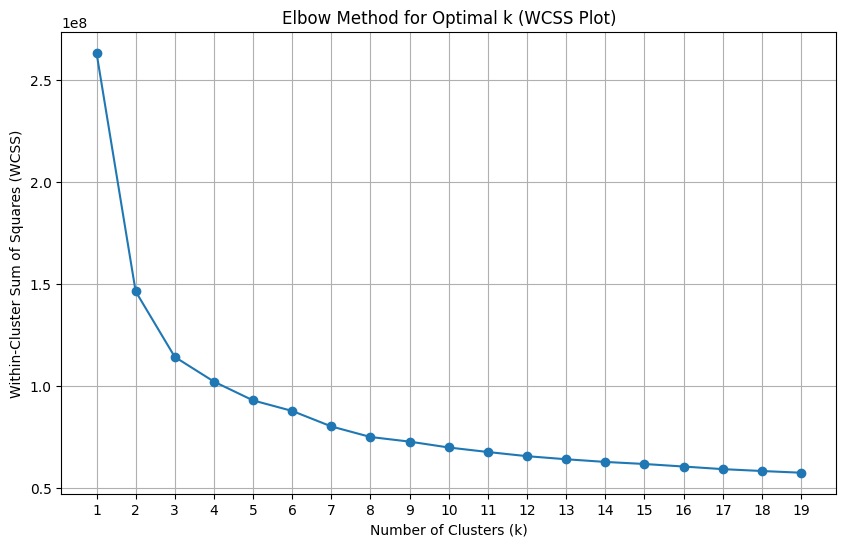


WCSS values for each k:
k=1: 263316160.0
k=2: 146431072.0
k=3: 114338384.0
k=4: 102256528.0
k=5: 93050656.0
k=6: 87890624.0
k=7: 80305728.0
k=8: 75137160.0
k=9: 72864488.0
k=10: 69992912.0
k=11: 67781696.0
k=12: 65738752.0
k=13: 64233392.0
k=14: 62926200.0
k=15: 61915600.0
k=16: 60671796.0
k=17: 59396628.0
k=18: 58478548.0
k=19: 57639624.0


In [7]:
# Initialize an empty list to store WCSS values
wcss = []
k_values = range(1, 20, 1) # Example: test k from 1 to 10
# Loop through each k value
for k in k_values:
    print(f"Processing k = {k}...")
    mb_kmeans = MiniBatchKMeans(n_clusters=k,
                                random_state=42,
                                batch_size=64 * k,
                                init='k-means++',
                                n_init=1,
                                init_size=100000,
                                reassignment_ratio=5e-4,
                                verbose=0) # Set verbose to 0 for cleaner output during loop

    mb_kmeans.fit(df)
    
    # The inertia_ attribute gives the WCSS for MiniBatchKMeans
    wcss.append(mb_kmeans.inertia_)
    
    # Optional: You can uncomment the lines below if you want to see predictions and centers for each k
    # predictions = mb_kmeans.labels_
    # cluster_centers = mb_kmeans.cluster_centers_
    # print(f"  WCSS for k={k}: {mb_kmeans.inertia_}")

# Plotting the WCSS values
plt.figure(figsize=(10, 6))
plt.plot(k_values, wcss, marker='o', linestyle='-')
plt.title('Elbow Method for Optimal k (WCSS Plot)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(k_values)
plt.grid(True)
plt.show()

print("\nWCSS values for each k:")
for k, score in zip(k_values, wcss):
    print(f"k={k}: {score}")

In [8]:
k=4
mb_kmeans = MiniBatchKMeans(n_clusters=k,
                            random_state=42,
                            batch_size=64 * k,
                            init='k-means++', n_init=1, init_size=100000,
                            reassignment_ratio=5e-4,
                            verbose=0)

mb_kmeans.fit(df)
predictions = mb_kmeans.labels_
cluster_centers = mb_kmeans.cluster_centers_

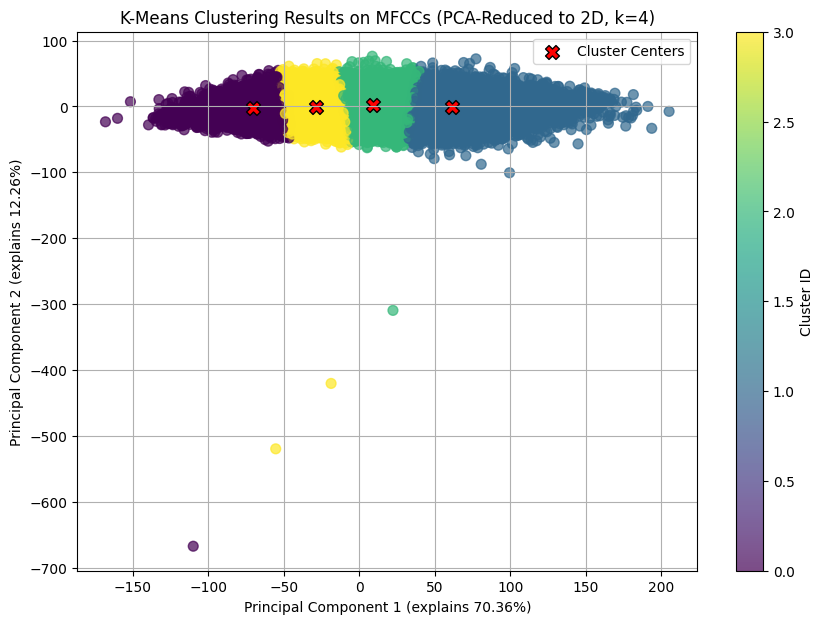

In [9]:
limit = 107303
pca_2d = PCA(n_components=2, random_state=42)
d_pca_2d = pca_2d.fit_transform(df[:limit])
cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

plt.figure(figsize=(10, 7))
# Scatter plot of PCA-reduced data points, colored by their assigned cluster
scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
# Plot the PCA-reduced cluster centers
plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=100, color='red',
            edgecolor='black', label='Cluster Centers')
plt.title(f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})')
plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
plt.colorbar(scatter_2d, label='Cluster ID')
plt.legend()
plt.grid(True)
# plt.show()

In [10]:
mel_clus = pd.DataFrame({
    "ID" : df.index,
    "cluster" : predictions,
})

In [11]:
mel_clus.head()

,ID,cluster
0,rugby_vsXaverian_050615_SLASH_rugby_vsXaverian...,3
1,gov_DOT_uscourts_DOT_ca5_DOT_18-30469_SLASH_go...,0
2,gov_DOT_uscourts_DOT_ca10_DOT_19-3108_SLASH_go...,1
3,gov_DOT_uscourts_DOT_ca9_DOT_02-50579_SLASH_go...,3
4,2001_Peters_Township_High_School_Commencement_...,2


In [12]:
main_df.head()


,ID,duration,wav,spk_id,sex,text
0,20091124-0900-PLENARY-18-en_20091124-22:35:55_9,17.120000,20091124-0900-PLENARY-18-en_20091124-22:35:55_...,1309,male,AND WHAT ABOUT INTEROPERABILITY IN THE RAIL SE...
1,20171024-0900-PLENARY-19-en_20171024-19:35:50_20,13.579937,20171024-0900-PLENARY-19-en_20171024-19:35:50_...,NaN,male,THIS WILL NOT HAPPEN THIS IS A PROMISE I MAKE ...
2,20150520-0900-PLENARY-8-en_20150520-13:27:12_5,9.797000,20150520-0900-PLENARY-8-en_20150520-13:27:12_5...,124985,male,IT IS GOOD TO SEE SOMETHING BEING DONE ABOUT I...
3,20170613-0900-PLENARY-9-en_20170613-13:02:00_0,16.377250,20170613-0900-PLENARY-9-en_20170613-13:02:00_0...,28115,female,MR PRESIDENT I WANT TO PUT ON THE RECORD MY SU...
4,20170911-0900-PLENARY-16-en_20170911-18:23:37_6,6.759938,20170911-0900-PLENARY-16-en_20170911-18:23:37_...,96897,male,POLITICAL CORRECTNESS IS THE CORNERSTONE OF TH...


In [14]:
fractions

[0.2, 0.4, 0.6, 0.8]

In [18]:
csv_location = "/local_disk/apollon/rwhetten/loquacious_small_train.csv"
save_location = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_mel/loquacious_small_train"
main_df = pd.read_csv(csv_location)

for i in fractions:
    # Assume df is your DataFrame with a 'cluster' column
    X = int(len(main_df) * i)  # total samples you want
    clusters = mel_clus['cluster'].unique()
    n_clusters = len(clusters)
    samples_per_cluster = X // n_clusters
    remainder = X % n_clusters
    
    # Group the dataframe by 'cluster'
    grouped = mel_clus.groupby('cluster')
    
    # Sample equally from each cluster
    sampled_df = grouped.apply(lambda g: g.sample(n=min(len(g), samples_per_cluster), random_state=0)).reset_index(drop=True)
    
    # If there's a remainder (e.g., 1000 samples over 3 clusters → 333 per cluster + 1 extra),
    # randomly pick clusters to get 1 more sample from
    if remainder > 0:
        cluster_sizes = mel_clus['cluster'].value_counts()
        eligible_clusters = cluster_sizes[cluster_sizes > samples_per_cluster].index
        extra_clusters = np.random.choice(eligible_clusters, size=remainder, replace=False)
    
        extras = mel_clus[mel_clus['cluster'].isin(extra_clusters)].groupby('cluster').apply(
            lambda g: g.sample(n=1, random_state=0)
        ).reset_index(drop=True)
    
        sampled_df = pd.concat([sampled_df, extras], ignore_index=True)
        
    print(len(sampled_df))
    # filter with main df and then save
    filtered_main_df = main_df[main_df['ID'].isin(sampled_df['ID'])]
    print(f"{filtered_main_df.duration.sum()/ 3600} hours")
    save_name = f"{save_location}_{str(i)}_mel.csv"
    print(f"saving to {save_name}")
    filtered_main_df.to_csv(save_name, index=False)

/tmp/ipykernel_11958/1114159945.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



21460
49.703293792457956 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_mel/loquacious_small_train_0.2_mel.csv


/tmp/ipykernel_11958/1114159945.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/1114159945.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



42921
99.14400005503592 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_mel/loquacious_small_train_0.4_mel.csv


/tmp/ipykernel_11958/1114159945.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/1114159945.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



59552
137.98328716218663 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_mel/loquacious_small_train_0.6_mel.csv


/tmp/ipykernel_11958/1114159945.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/1114159945.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



75110
174.55953673628824 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_mel/loquacious_small_train_0.8_mel.csv


## LG

In [23]:
df = pd.DataFrame.from_dict(mel_lg['results']).T
df.head()

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
snafuinfinityfootball_vsWOBURN_092118-CL19_SLASH_football_vsWOBURN_092118-CL19_DOT_mp3_00025.flac,-150.178024,20.112110,-11.501924,-1.449854,-15.125900,0.157504,-5.432830,-1.768510,-3.259856,-3.649934,...,-0.001829,0.001195,-0.011839,0.007008,0.006832,0.007198,-0.001744,-0.002431,-0.017000,-0.012432
Grad2009_SLASH_Grad2009_DOT_mp3_00006.flac,-179.132660,25.008080,2.044729,6.493776,-3.964765,-2.304045,1.511492,-2.448147,1.143050,0.940334,...,-0.008804,0.022103,0.023557,-0.013852,0.001505,0.003159,0.004628,-0.004877,-0.002304,-0.007152
texas_terror_1935_SLASH_texas_terror_1935_DOT_mp3_00002.flac,-181.057144,26.448055,-7.964648,2.730549,-0.780316,-0.657237,-0.104363,0.957595,-2.103266,-0.983917,...,0.039257,0.016973,-0.012449,0.004981,0.030585,0.010287,-0.021672,-0.019635,-0.012271,-0.001298
unfinished_task_SLASH_unfinished_task_DOT_mp3_00022.flac,-133.819336,42.418552,-22.415033,7.140134,1.418300,-9.882423,-9.354074,-4.318173,-3.120260,-1.788946,...,0.007597,-0.003642,0.006924,0.003304,-0.006618,-0.003144,0.000489,0.005005,-0.000316,0.000715
gov_DOT_uscourts_DOT_ca3_DOT_19-2975_SLASH_gov_DOT_uscourts_DOT_ca3_DOT_19-2975_DOT_2020-10-21_DOT_mp3_00006.flac,-175.453720,27.233545,-13.083720,8.682267,-9.429398,-9.109363,-6.361362,-16.926861,0.736825,0.722593,...,-0.004237,-0.033426,-0.016063,0.006987,-0.007664,0.006543,0.017294,0.017431,0.013511,0.006377


Processing k = 1...
Processing k = 2...
Processing k = 3...
Processing k = 4...
Processing k = 5...
Processing k = 6...
Processing k = 7...
Processing k = 8...
Processing k = 9...
Processing k = 10...
Processing k = 11...
Processing k = 12...
Processing k = 13...
Processing k = 14...
Processing k = 15...
Processing k = 16...
Processing k = 17...
Processing k = 18...
Processing k = 19...


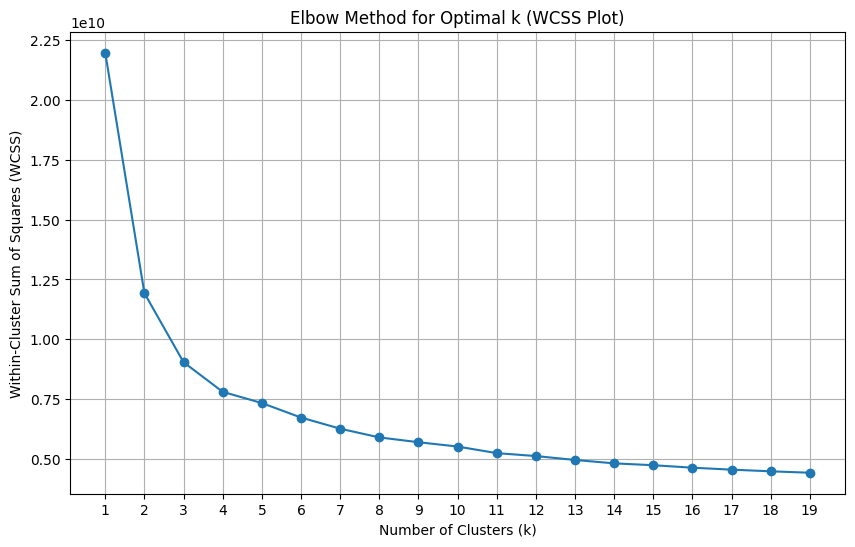


WCSS values for each k:
k=1: 21960067072.0
k=2: 11926680576.0
k=3: 9045379072.0
k=4: 7809442816.0
k=5: 7340285440.0
k=6: 6736534016.0
k=7: 6270742528.0
k=8: 5907053568.0
k=9: 5706498048.0
k=10: 5525475328.0
k=11: 5250940928.0
k=12: 5128557056.0
k=13: 4965635072.0
k=14: 4823612416.0
k=15: 4746083328.0
k=16: 4642832384.0
k=17: 4561138176.0
k=18: 4491819008.0
k=19: 4432823296.0


In [20]:
# Initialize an empty list to store WCSS values
wcss = []
k_values = range(1, 20, 1) # Example: test k from 1 to 10
# Loop through each k value
for k in k_values:
    print(f"Processing k = {k}...")
    mb_kmeans = MiniBatchKMeans(n_clusters=k,
                                random_state=42,
                                batch_size=64 * k,
                                init='k-means++',
                                n_init=1,
                                init_size=100000,
                                reassignment_ratio=5e-4,
                                verbose=0) # Set verbose to 0 for cleaner output during loop

    mb_kmeans.fit(df)
    
    # The inertia_ attribute gives the WCSS for MiniBatchKMeans
    wcss.append(mb_kmeans.inertia_)
    
    # Optional: You can uncomment the lines below if you want to see predictions and centers for each k
    # predictions = mb_kmeans.labels_
    # cluster_centers = mb_kmeans.cluster_centers_
    # print(f"  WCSS for k={k}: {mb_kmeans.inertia_}")

# Plotting the WCSS values
plt.figure(figsize=(10, 6))
plt.plot(k_values, wcss, marker='o', linestyle='-')
plt.title('Elbow Method for Optimal k (WCSS Plot)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(k_values)
plt.grid(True)
plt.show()

print("\nWCSS values for each k:")
for k, score in zip(k_values, wcss):
    print(f"k={k}: {score}")

In [24]:
k=4
mb_kmeans = MiniBatchKMeans(n_clusters=k,
                            random_state=42,
                            batch_size=64 * k,
                            init='k-means++', n_init=1, init_size=100000,
                            reassignment_ratio=5e-4,
                            verbose=0)

mb_kmeans.fit(df)
predictions = mb_kmeans.labels_
cluster_centers = mb_kmeans.cluster_centers_

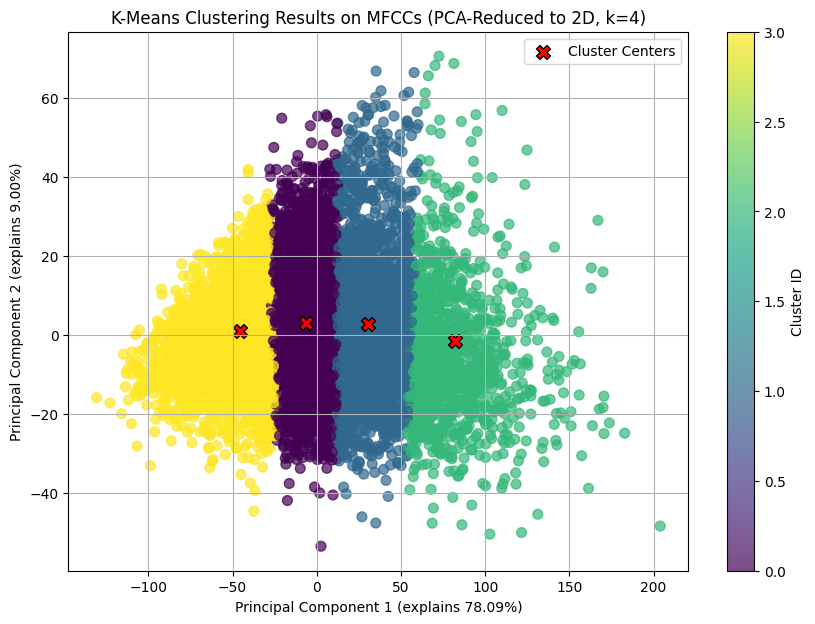

In [26]:
limit = 10000
pca_2d = PCA(n_components=2, random_state=42)
d_pca_2d = pca_2d.fit_transform(df[:limit])
cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

plt.figure(figsize=(10, 7))
# Scatter plot of PCA-reduced data points, colored by their assigned cluster
scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
# Plot the PCA-reduced cluster centers
plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=100, color='red',
            edgecolor='black', label='Cluster Centers')
plt.title(f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})')
plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
plt.colorbar(scatter_2d, label='Cluster ID')
plt.legend()
plt.grid(True)

In [27]:
mel_clus = pd.DataFrame({
    "ID" : df.index,
    "cluster" : predictions,
})

In [28]:
len(mel_clus)

9487873

In [29]:
csv_location = "/local_disk/apollon/rwhetten/loquacious_large_train.csv"
save_location = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_mel/loquacious_large_train"
main_df = pd.read_csv(csv_location)

for i in fractions:
    # Assume df is your DataFrame with a 'cluster' column
    X = int(len(main_df) * i)  # total samples you want
    clusters = mel_clus['cluster'].unique()
    n_clusters = len(clusters)
    samples_per_cluster = X // n_clusters
    remainder = X % n_clusters
    
    # Group the dataframe by 'cluster'
    grouped = mel_clus.groupby('cluster')
    
    # Sample equally from each cluster
    sampled_df = grouped.apply(lambda g: g.sample(n=min(len(g), samples_per_cluster), random_state=42)).reset_index(drop=True)
    
    # If there's a remainder (e.g., 1000 samples over 3 clusters → 333 per cluster + 1 extra),
    # randomly pick clusters to get 1 more sample from
    if remainder > 0:
        cluster_sizes = mel_clus['cluster'].value_counts()
        eligible_clusters = cluster_sizes[cluster_sizes > samples_per_cluster].index
        extra_clusters = np.random.choice(eligible_clusters, size=remainder, replace=False)
    
        extras = mel_clus[mel_clus['cluster'].isin(extra_clusters)].groupby('cluster').apply(
            lambda g: g.sample(n=1, random_state=42)
        ).reset_index(drop=True)
    
        sampled_df = pd.concat([sampled_df, extras], ignore_index=True)
    print(len(sampled_df))
    # filter with main df and then save
    filtered_main_df = main_df[main_df['ID'].isin(sampled_df['ID'])]
    print(f"{filtered_main_df.duration.sum()/ 3600} hours")
    save_name = f"{save_location}_{str(fraction)}_mel.csv"
    filtered_main_df.to_csv(save_name, index=False)

/tmp/ipykernel_11958/2997205888.py:3: DtypeWarning:

Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.

/tmp/ipykernel_11958/2997205888.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/2997205888.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1897575
4929.958189670869 hours


/tmp/ipykernel_11958/2997205888.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/2997205888.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



3795150
9853.90240092684 hours


/tmp/ipykernel_11958/2997205888.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/2997205888.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



5492453
14326.795207875193 hours


/tmp/ipykernel_11958/2997205888.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_11958/2997205888.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



6741925
17691.862274457595 hours


In [30]:
sampled_df.groupby('cluster').count()

,ID
cluster,
0,1897576
1,1897575
2,1222908
3,1723866


# Utility Function for Sampling from K-Means

In [132]:
def sample_based_on_cluster(csv_loc, save_loc, fracts, cluster_df, name_ending="mel", random_state=0):
    # csv_loc = "/local_disk/apollon/rwhetten/loquacious_small_train.csv"
    # save_loc = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_mel/loquacious_small_train"
    main_df = pd.read_csv(csv_loc)
    hours = []
    for i in fractions:
        # Assume df is your DataFrame with a 'cluster' column
        X = int(len(main_df) * i)  # total samples you want
        clusters = cluster_df['cluster'].unique()
        n_clusters = len(clusters)
        samples_per_cluster = X // n_clusters
        remainder = X % n_clusters

        print(samples_per_cluster)
        # Group the dataframe by 'cluster'
        grouped = cluster_df.groupby('cluster')
        
        # Sample equally from each cluster
        sampled_df = grouped.apply(lambda g: g.sample(n=min(len(g), samples_per_cluster), random_state=random_state)).reset_index(drop=True)
        
        # If there's a remainder (e.g., 1000 samples over 3 clusters → 333 per cluster + 1 extra),
        # randomly pick clusters to get 1 more sample from
        if remainder > 0:
            cluster_sizes = cluster_df['cluster'].value_counts()
            eligible_clusters = cluster_sizes[cluster_sizes > samples_per_cluster].index
            extra_clusters = np.random.choice(eligible_clusters, size=min(len(eligible_clusters), remainder), replace=False)
        
            extras = cluster_df[cluster_df['cluster'].isin(extra_clusters)].groupby('cluster').apply(
                lambda g: g.sample(n=1, random_state=random_state)
            ).reset_index(drop=True)
        
            sampled_df = pd.concat([sampled_df, extras], ignore_index=True)
            
        print(len(sampled_df))
        # filter with main df and then save
        filtered_main_df = main_df[main_df['ID'].isin(sampled_df['ID'])]
        hours.append(filtered_main_df.duration.sum()/ 3600)
        print(f"{filtered_main_df.duration.sum()/ 3600} hours")
        save_name = f"{save_loc}_{str(i)}_{name_ending}.csv"
        print(f"saving to {save_name}")
        filtered_main_df.to_csv(save_name, index=False)
    return hours

# Sample based on speaker embeddings

## small

In [4]:
df_speaker = pd.DataFrame.from_dict(speaker['results']).T
df_speaker.head()

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
common_voice_en_24146008,-0.224990,-0.064609,-0.501496,-0.321037,0.166265,0.207059,-0.071313,0.125329,-0.146821,0.020395,...,0.381471,0.057810,-0.218501,-0.182242,0.276759,0.215276,0.227152,-0.157252,0.255455,0.196293
common_voice_en_19283701,0.080336,0.021248,0.012901,-0.319770,0.142971,0.058614,-0.327455,-0.080786,-0.035303,-0.092950,...,-0.171805,0.145816,0.110169,-0.032337,0.277806,-0.140520,0.063454,-0.039363,-0.052334,-0.296683
common_voice_en_29851180,-0.127730,-0.064158,0.138645,-0.459717,0.043553,0.046773,-0.106986,0.088134,0.155397,0.218202,...,0.318263,-0.023648,0.009230,-0.311788,0.222778,0.235446,0.023832,-0.011030,-0.005480,0.096868
common_voice_en_31934744,-0.027230,0.045542,-0.033144,0.042867,0.032638,0.104369,0.256894,0.031085,0.118302,0.013488,...,-0.166254,-0.024266,-0.066041,0.103622,-0.066448,0.059844,-0.054693,-0.055785,0.096407,0.015177
common_voice_en_36303288,-0.106699,0.170953,-0.000962,0.056935,0.137603,0.025845,0.152257,-0.069499,0.179031,0.017337,...,-0.158327,-0.019315,0.105360,-0.152181,-0.061221,-0.029839,-0.120326,0.003563,0.264232,0.074354


In [12]:
# # Initialize an empty list to store WCSS values
# wcss = []
# k_values = range(1, 1001, 500) # Example: test k from 1 to 10
# # Loop through each k value
# for k in k_values:
#     print(f"Processing k = {k}...")
#     mb_kmeans = MiniBatchKMeans(n_clusters=k,
#                                 random_state=42,
#                                 batch_size=64 * k,
#                                 init='k-means++',
#                                 n_init=1,
#                                 init_size=100000,
#                                 reassignment_ratio=5e-4,
#                                 verbose=0) # Set verbose to 0 for cleaner output during loop

#     mb_kmeans.fit(df_speaker)
    
#     # The inertia_ attribute gives the WCSS for MiniBatchKMeans
#     wcss.append(mb_kmeans.inertia_)
    
#     # Optional: You can uncomment the lines below if you want to see predictions and centers for each k
#     # predictions = mb_kmeans.labels_
#     # cluster_centers = mb_kmeans.cluster_centers_
#     # print(f"  WCSS for k={k}: {mb_kmeans.inertia_}")

# # Plotting the WCSS values
# plt.figure(figsize=(10, 6))
# plt.plot(k_values, wcss, marker='o', linestyle='-')
# plt.title('Elbow Method for Optimal k (WCSS Plot)')
# plt.xlabel('Number of Clusters (k)')
# plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
# plt.xticks(k_values)
# plt.grid(True)
# plt.show()

# print("\nWCSS values for each k:")
# for k, score in zip(k_values, wcss):
#     print(f"k={k}: {score}")

In [68]:
k=100
mb_kmeans = MiniBatchKMeans(n_clusters=k,
                            random_state=42,
                            batch_size=64 * k,
                            init='k-means++', n_init=1, init_size=100000,
                            reassignment_ratio=5e-4,
                            verbose=0)

mb_kmeans.fit(df_speaker)
predictions = mb_kmeans.labels_
cluster_centers = mb_kmeans.cluster_centers_

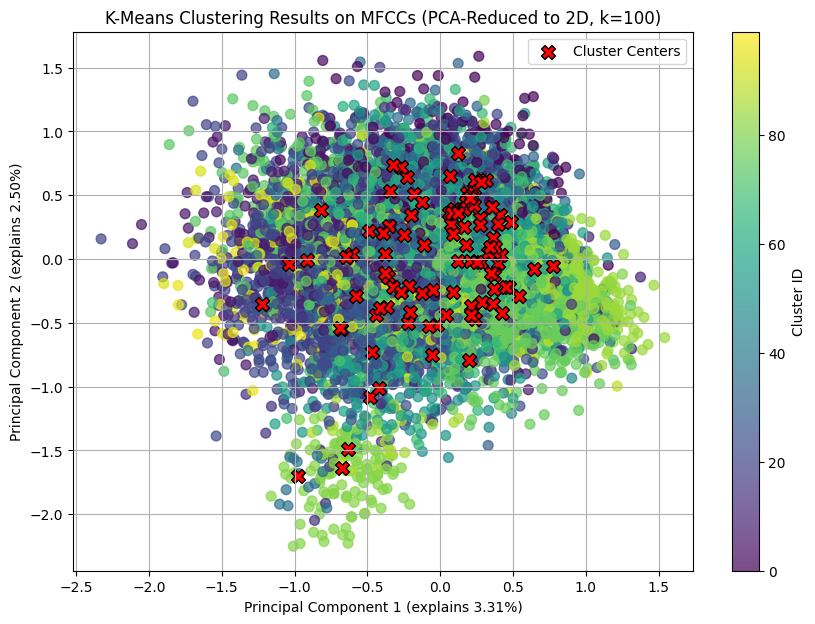

In [69]:
limit = 10700
pca_2d = PCA(n_components=2, random_state=42)
d_pca_2d = pca_2d.fit_transform(df_speaker[:limit])
cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

plt.figure(figsize=(10, 7))
# Scatter plot of PCA-reduced data points, colored by their assigned cluster
scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
# Plot the PCA-reduced cluster centers
plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=100, color='red',
            edgecolor='black', label='Cluster Centers')
plt.title(f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})')
plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
plt.colorbar(scatter_2d, label='Cluster ID')
plt.legend()
plt.grid(True)

In [70]:
speaker_clus = pd.DataFrame({
    "ID" : df_speaker.index,
    "cluster" : predictions,
})

In [104]:

csv_location = "/local_disk/apollon/rwhetten/loquacious_small_train.csv"
save_location = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_speaker/loquacious_small_train"
main_df = pd.read_csv(csv_location)

hours = sample_based_on_cluster(csv_location, save_location, fractions, speaker_clus, "speaker", 42)

/tmp/ipykernel_19420/3327689845.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/3327689845.py:27: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



20011
49.737302211238664 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_speaker/loquacious_small_train_0.2_speaker.csv


/tmp/ipykernel_19420/3327689845.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/3327689845.py:27: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



35094
86.00203962831081 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_speaker/loquacious_small_train_0.4_speaker.csv


/tmp/ipykernel_19420/3327689845.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/3327689845.py:27: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



47994
116.38104588870387 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_speaker/loquacious_small_train_0.6_speaker.csv


/tmp/ipykernel_19420/3327689845.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/3327689845.py:27: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



59629
143.20565618301603 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_speaker/loquacious_small_train_0.8_speaker.csv


In [97]:
test = pd.read_csv("/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/small_speaker/loquacious_small_train_0.8_speaker.csv")
test[test.ID.duplicated()]

,ID,duration,wav,spk_id,sex,text


In [22]:
speaker_clus.to_csv("/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/loquacious_small_train_speaker_clusters.csv", index=False)

,ID,cluster
34,gov_DOT_uscourts_DOT_ca9_DOT_20-15447_SLASH_go...,1
2441,w8hvxrjh49M-00122-00043700-00044000.wav,1
2652,Wu3zL5ae9Ec-00509-00253356-00253673.wav,1
2660,XJ24tbhVfx0-00387-00137356-00137660.wav,1
2755,tPNj0Cd3Umg-00470-00174103-00174418.wav,1


<Axes: >

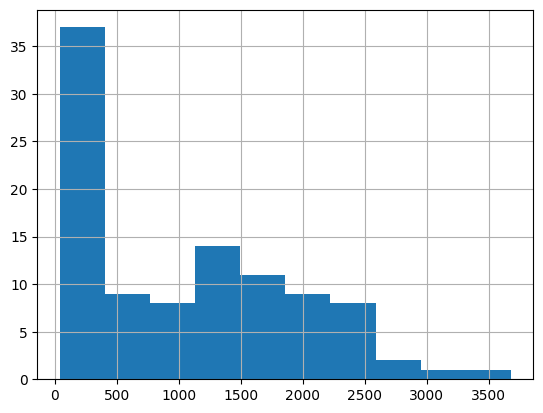

In [71]:
# speaker_clus.groupby('cluster').sum()
speaker_clus.cluster.value_counts().hist()

In [72]:
pd.DataFrame(speaker_clus.cluster.value_counts())

,count
cluster,
77,3677
63,3067
58,2788
52,2643
71,2531
...,...
86,99
97,77
62,73


In [73]:
speaker_clus[speaker_clus.cluster == 11].head()

,ID,cluster
715,20181024-0900-PLENARY-en_20181024-21:48:46_4,11
722,20170301-0900-PLENARY-12-en_20170301-18:17:45_8,11
723,20091124-0900-PLENARY-14-en_20091124-20:08:34_2,11
742,20180531-0900-PLENARY-2-en_20180531-09:01:13_9,11
769,20200917-0900-PLENARY-en_20200917-11:06:57_21,11


In [75]:
from IPython.display import Audio, display
samplerate=16000

for i, r in speaker_clus[speaker_clus.cluster == 12].head().iterrows():
    print(r.ID)
    sig = read_audio(f"/local_disk/apollon/rwhetten/wavs/small/train/{r.ID}.wav")
    display(Audio(sig, rate=samplerate))

20120417-0900-PLENARY-11-en_20120417-20:23:15_41


20091111-0900-PLENARY-21-en_20091112-00:07:51_42


20100119-0900-PLENARY-5-en_20100119-16:24:24_31


20111213-0900-PLENARY-12-en_20111213-18:16:00_13


20120417-0900-PLENARY-11-en_20120417-20:23:15_37


## LG

In [109]:
df_speaker_lg = pd.DataFrame.from_dict(speaker_lg['results']).T
df_speaker_lg.head()

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
snafuinfinityfootball_vsWOBURN_092118-CL19_SLASH_football_vsWOBURN_092118-CL19_DOT_mp3_00025.flac,-0.046254,-0.064087,-0.096097,-0.107513,-0.050994,-0.032374,0.249068,-0.219559,0.045343,0.027503,...,-0.205633,-0.043007,-0.100376,-0.094326,-0.042314,-0.124987,0.033182,0.244299,0.234942,0.045202
Grad2009_SLASH_Grad2009_DOT_mp3_00006.flac,0.092818,-0.343982,-0.237657,-0.384233,0.456225,-0.012949,0.179669,-0.305312,0.140377,-0.175030,...,0.054900,0.007778,0.040266,0.204871,0.114417,-0.367068,-0.240021,0.098663,0.197409,-0.117200
texas_terror_1935_SLASH_texas_terror_1935_DOT_mp3_00002.flac,-0.054206,-0.088970,-0.124893,-0.014069,-0.140625,0.161785,0.026947,-0.030485,0.082166,-0.058114,...,-0.150152,0.055224,0.112032,0.084941,0.036592,-0.088939,-0.032801,0.174502,0.311173,-0.001009
unfinished_task_SLASH_unfinished_task_DOT_mp3_00022.flac,0.055183,-0.191430,-0.021690,-0.285761,0.225623,-0.086730,0.106433,-0.339067,0.055312,0.150259,...,-0.038836,0.299592,0.099919,0.070111,-0.025070,-0.167474,-0.147892,0.332172,0.108491,-0.081120
gov_DOT_uscourts_DOT_ca3_DOT_19-2975_SLASH_gov_DOT_uscourts_DOT_ca3_DOT_19-2975_DOT_2020-10-21_DOT_mp3_00006.flac,-0.241946,-0.115047,-0.134957,-0.243144,0.081856,-0.002123,0.079598,0.109838,-0.040556,0.000471,...,0.121072,-0.130224,0.012651,-0.470264,-0.252125,-0.141382,0.125283,0.044098,0.149792,-0.065720


In [110]:
len(df_speaker_lg)

9487873

In [150]:
k=1024
mb_kmeans = MiniBatchKMeans(n_clusters=k,
                            random_state=42,
                            batch_size=64 * k,
                            init='k-means++', n_init=1, init_size=100000,
                            reassignment_ratio=5e-4,
                            verbose=0)

mb_kmeans.fit(df_speaker_lg)
predictions = mb_kmeans.labels_
cluster_centers = mb_kmeans.cluster_centers_

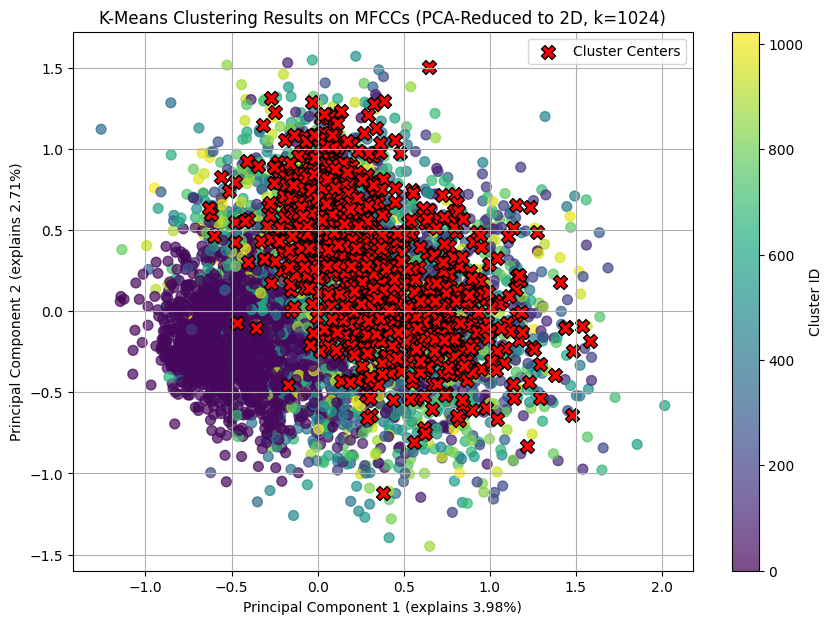

In [151]:
limit = 5000
pca_2d = PCA(n_components=2, random_state=42)
d_pca_2d = pca_2d.fit_transform(df_speaker_lg[:limit])
cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

plt.figure(figsize=(10, 7))
# Scatter plot of PCA-reduced data points, colored by their assigned cluster
scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
# Plot the PCA-reduced cluster centers
plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=100, color='red',
            edgecolor='black', label='Cluster Centers')
plt.title(f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})')
plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
plt.colorbar(scatter_2d, label='Cluster ID')
plt.legend()
plt.grid(True)

In [152]:
speaker_clus_lg = pd.DataFrame({
    "ID" : df_speaker_lg.index,
    "cluster" : predictions,
})

In [153]:
len(speaker_clus_lg)

9487873

In [139]:
hours

[5226.973653516411, 9734.605954040808, 13281.143386622982, 16158.71684651977]

In [154]:
csv_location = "/local_disk/apollon/rwhetten/loquacious_large_train.csv"
save_location = "/local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_speaker/loquacious_large_train"
main_df = pd.read_csv(csv_location)

hours = sample_based_on_cluster(csv_location, save_location, fractions, speaker_clus_lg, "speaker", 42)

/tmp/ipykernel_19420/853098108.py:3: DtypeWarning:

Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.

/tmp/ipykernel_19420/1763276435.py:4: DtypeWarning:

Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.



1853


/tmp/ipykernel_19420/1763276435.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/1763276435.py:28: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1846379
5226.973653516411 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_speaker/loquacious_large_train_0.2_speaker.csv
3706


/tmp/ipykernel_19420/1763276435.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/1763276435.py:28: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



3446879
9734.605954040808 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_speaker/loquacious_large_train_0.4_speaker.csv
5559


/tmp/ipykernel_19420/1763276435.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/1763276435.py:28: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



4737590
13281.143386622982 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_speaker/loquacious_large_train_0.6_speaker.csv
7412


/tmp/ipykernel_19420/1763276435.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_19420/1763276435.py:28: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



5815423
16158.71684651977 hours
saving to /local_disk/apollon/rwhetten/sss_data_selection/sample/csvs/large_speaker/loquacious_large_train_0.8_speaker.csv


In [155]:
hours

[5226.973653516411, 9734.605954040808, 13281.143386622982, 16158.71684651977]

In [156]:
hours

[5226.973653516411, 9734.605954040808, 13281.143386622982, 16158.71684651977]

In [157]:
pd.DataFrame(speaker_clus_lg.cluster.value_counts())

,count
cluster,
606,65178
1008,47039
193,46001
524,44426
22,42415
...,...
702,502
288,472
969,452


# MFCCs + ' + "

In [13]:
# Fit KMeans
mb_kmeans = MiniBatchKMeans(
    n_clusters=k,
    random_state=42,
    batch_size=64 * k,
    init='k-means++',
    n_init=1,
    init_size=100000,
    reassignment_ratio=5e-4,
    verbose=0
)
mb_kmeans.fit(df)
predictions = mb_kmeans.labels_
cluster_centers = mb_kmeans.cluster_centers_


In [14]:
# PCA
limit = 107303
pca_2d = PCA(n_components=2, random_state=42)
d_pca_2d = pca_2d.fit_transform(df[:limit])
cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

In [15]:
# Build hover info with index
hover_text = [f"Index: {i}" for i in range(limit)]

# Create scatter plot
fig = go.Figure()

# Add data points
fig.add_trace(go.Scatter(
    x=d_pca_2d[:, 0],
    y=d_pca_2d[:, 1],
    mode='markers',
    marker=dict(
        size=6,
        color=predictions,
        colorscale='Viridis',
        opacity=0.7,
        colorbar=dict(title='Cluster ID')
    ),
    text=hover_text,
    hoverinfo='text',
    name='Data Points'
))

# Add cluster centers
fig.add_trace(go.Scatter(
    x=cluster_centers_pca_2d[:, 0],
    y=cluster_centers_pca_2d[:, 1],
    mode='markers',
    marker=dict(
        size=14,
        symbol='x',
        color='red',
        line=dict(width=2, color='black')
    ),
    name='Cluster Centers'
))

# Layout
fig.update_layout(
    title=f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})',
    xaxis_title=f'Principal Component 1 ({pca_2d.explained_variance_ratio_[0]*100:.2f}%)',
    yaxis_title=f'Principal Component 2 ({pca_2d.explained_variance_ratio_[1]*100:.2f}%)',
    legend=dict(title='Legend'),
    width=900,
    height=700
)

fig.show()

### load file from dataset

In [16]:
# load dataset
hf_data_dict = load_datasets(
    "small",
    "speechbrain/LoquaciousSet",
    "/local_disk/apollon/rwhetten/hf_root/datasets",
)

Resolving data files:   0%|          | 0/6323 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/66 [00:00<?, ?it/s]

In [17]:
# Build an ID-to-item index
# id_to_item = {item["ID"]: item for item in hf_data_dict["train"]}
id_to_item = {}
for i, item in enumerate(tqdm(hf_data_dict["train"])):
    id_to_item[item["ID"]] = item
    

  0%|          | 0/107303 [00:00<?, ?it/s]

In [25]:
loi = [101818, 107241, 32668, 107302, 105666, 105406, 102414]

In [26]:
from IPython.display import Audio, display
samplerate=16000
for i in loi:
    fn = df.iloc[i].name
    f = id_to_item.get(fn)
    sig = read_audio(f["wav"]["bytes"])
    display(Audio(sig, rate=samplerate))


# Speaker Embeddings

In [27]:
df_speaker = pd.DataFrame.from_dict(speaker_lg['results']).T
df_speaker.head()

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
snafuinfinityfootball_vsWOBURN_092118-CL19_SLASH_football_vsWOBURN_092118-CL19_DOT_mp3_00025.flac,-0.046254,-0.064087,-0.096097,-0.107513,-0.050994,-0.032374,0.249068,-0.219559,0.045343,0.027503,...,-0.205633,-0.043007,-0.100376,-0.094326,-0.042314,-0.124987,0.033182,0.244299,0.234942,0.045202
Grad2009_SLASH_Grad2009_DOT_mp3_00006.flac,0.092818,-0.343982,-0.237657,-0.384233,0.456225,-0.012949,0.179669,-0.305312,0.140377,-0.175030,...,0.054900,0.007778,0.040266,0.204871,0.114417,-0.367068,-0.240021,0.098663,0.197409,-0.117200
texas_terror_1935_SLASH_texas_terror_1935_DOT_mp3_00002.flac,-0.054206,-0.088970,-0.124893,-0.014069,-0.140625,0.161785,0.026947,-0.030485,0.082166,-0.058114,...,-0.150152,0.055224,0.112032,0.084941,0.036592,-0.088939,-0.032801,0.174502,0.311173,-0.001009
unfinished_task_SLASH_unfinished_task_DOT_mp3_00022.flac,0.055183,-0.191430,-0.021690,-0.285761,0.225623,-0.086730,0.106433,-0.339067,0.055312,0.150259,...,-0.038836,0.299592,0.099919,0.070111,-0.025070,-0.167474,-0.147892,0.332172,0.108491,-0.081120
gov_DOT_uscourts_DOT_ca3_DOT_19-2975_SLASH_gov_DOT_uscourts_DOT_ca3_DOT_19-2975_DOT_2020-10-21_DOT_mp3_00006.flac,-0.241946,-0.115047,-0.134957,-0.243144,0.081856,-0.002123,0.079598,0.109838,-0.040556,0.000471,...,0.121072,-0.130224,0.012651,-0.470264,-0.252125,-0.141382,0.125283,0.044098,0.149792,-0.065720


In [33]:
len(df_speaker) == len(df)

True

In [29]:
# with open('speaker_lg.npy', 'wb') as f:
#     np.save(f, np.array(df_speaker))

In [41]:
k=100
mb_kmeans = MiniBatchKMeans(n_clusters=k,
                            random_state=42,
                            batch_size=64 * k,
                            init='k-means++', n_init=1, init_size=100000,
                            reassignment_ratio=5e-4,
                            verbose=2)

mb_kmeans.fit(df_speaker)
predictions = mb_kmeans.labels_
cluster_centers = mb_kmeans.cluster_centers_

Init 1/1 with method k-means++
Inertia for init 1/1: 1168212.375
Minibatch step 1/148248: mean batch inertia: 11.74656005859375
Minibatch step 2/148248: mean batch inertia: 9.169507446289062, ewa inertia: 9.169507446289062
Minibatch step 3/148248: mean batch inertia: 8.937924194335938, ewa inertia: 9.169195019540457
Minibatch step 4/148248: mean batch inertia: 8.830819091796876, ewa inertia: 9.168738519815111
Minibatch step 5/148248: mean batch inertia: 8.780599365234375, ewa inertia: 9.168214884996749
Minibatch step 6/148248: mean batch inertia: 8.750467529296875, ewa inertia: 9.167651306037653
Minibatch step 7/148248: mean batch inertia: 8.723016357421875, ewa inertia: 9.16705145328431
Minibatch step 8/148248: mean batch inertia: 8.783201904296876, ewa inertia: 9.166533605531797
Minibatch step 9/148248: mean batch inertia: 8.763055419921875, ewa inertia: 9.165989276973491
Minibatch step 10/148248: mean batch inertia: 8.670405883789062, ewa inertia: 9.165320690161234
Minibatch step 11

In [50]:
limit = 10000

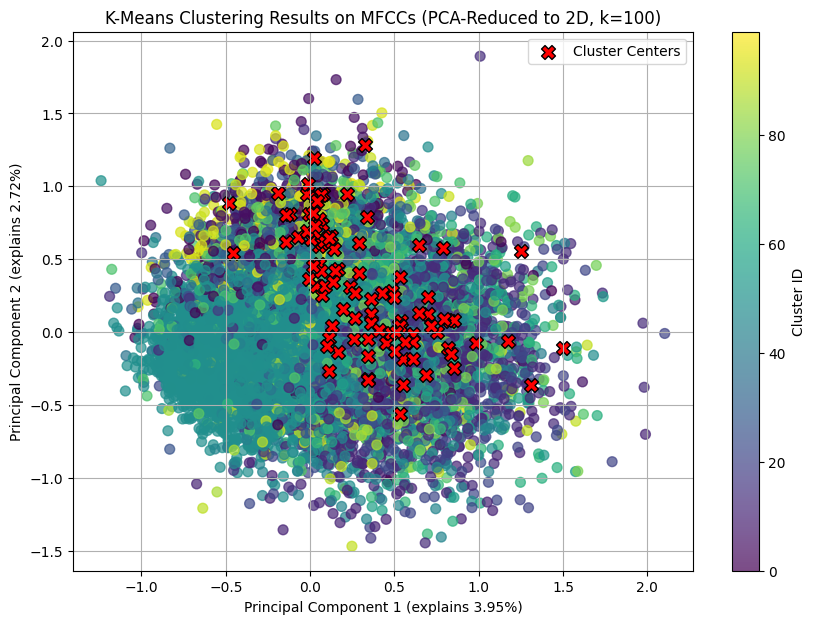

In [51]:
pca_2d = PCA(n_components=2, random_state=42)
d_pca_2d = pca_2d.fit_transform(df_speaker[:limit])
cluster_centers_pca_2d = pca_2d.transform(cluster_centers)

plt.figure(figsize=(10, 7))
# Scatter plot of PCA-reduced data points, colored by their assigned cluster
scatter_2d = plt.scatter(d_pca_2d[:, 0], d_pca_2d[:, 1], c=predictions[:limit], cmap='viridis', s=50, alpha=0.7)
# Plot the PCA-reduced cluster centers
plt.scatter(cluster_centers_pca_2d[:, 0], cluster_centers_pca_2d[:, 1], marker='X', s=100, color='red',
            edgecolor='black', label='Cluster Centers')
plt.title(f'K-Means Clustering Results on MFCCs (PCA-Reduced to 2D, k={k})')
plt.xlabel(f'Principal Component 1 (explains {pca_2d.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'Principal Component 2 (explains {pca_2d.explained_variance_ratio_[1]*100:.2f}%)')
plt.colorbar(scatter_2d, label='Cluster ID')
plt.legend()
plt.grid(True)
plt.show()
# plt.savefig('speaker_lg_kmeans_100_pca_2.svg')